# Practical Work 2

- For this practical work, the trainees will develop a Python program that is able to implement the gradient descent in order to achieve the linear regression (Multivariables) of a set of datapoints.
- We will do a vectorize implementation (Using Matrix vectors operations) which is the more general and effecient form of GD implementation.
- As we did with the single variable we will do step by step implementation then combine all steps togeteher then make a function for the Multivariables LR training using GD.

### Prerequisites:
- You should have seen <b>Day 1 and Day 2 as well as Day 3 Part 1</b> from our course <b><i>Master Numerical Optimization for Machine Learning and Deep Learning in 5 Days</b></i>.
- The course is available for free on our channel <b><i>Artificial Intelligence & Data Science شرح بالعربي</i></b>.
- Course link https://youtube.com/playlist?list=PLJM7jJIw2GC15hvIwN8sBXok__yLMcMxN&feature=shared

### Whatsapp Channel: 
https://whatsapp.com/channel/0029Va0cflnId7nVMfzByO3k

### Import numpy, matplotlib.pyplot

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Read MultiVarLR.csv file into numpy array 

In [2]:
data = np.genfromtxt("C:/Users/Dareen/Downloads/MultiVarLR (1).csv",delimiter=',')

In [3]:
data

array([[ 73.,  80.,  75., 152.],
       [ 93.,  88.,  93., 185.],
       [ 89.,  91.,  90., 180.],
       [ 96.,  98., 100., 196.],
       [ 73.,  66.,  70., 142.],
       [ 53.,  46.,  55., 101.],
       [ 69.,  74.,  77., 149.],
       [ 47.,  56.,  60., 115.],
       [ 87.,  79.,  90., 175.],
       [ 79.,  70.,  88., 164.],
       [ 69.,  70.,  73., 141.],
       [ 70.,  65.,  74., 141.],
       [ 93.,  95.,  91., 184.],
       [ 79.,  80.,  73., 152.],
       [ 70.,  73.,  78., 148.],
       [ 93.,  89.,  96., 192.],
       [ 78.,  75.,  68., 147.],
       [ 81.,  90.,  93., 183.],
       [ 88.,  92.,  86., 177.],
       [ 78.,  83.,  77., 159.],
       [ 82.,  86.,  90., 177.],
       [ 86.,  82.,  89., 175.],
       [ 78.,  83.,  85., 175.],
       [ 76.,  83.,  71., 149.],
       [ 96.,  93.,  95., 192.]])

### Define variables X and y. 
### Assign all columns data except the last one to X and last column to y
<b>Notes:</b> 
- We have here 3 independent variables and one dependent variable.
- Make sure <b>y</b> is a column vector to obtain correct matrix vector operations.

In [17]:
x= data[:,:3]
y=data[:,3]

In [18]:
x

array([[ 73.,  80.,  75.],
       [ 93.,  88.,  93.],
       [ 89.,  91.,  90.],
       [ 96.,  98., 100.],
       [ 73.,  66.,  70.],
       [ 53.,  46.,  55.],
       [ 69.,  74.,  77.],
       [ 47.,  56.,  60.],
       [ 87.,  79.,  90.],
       [ 79.,  70.,  88.],
       [ 69.,  70.,  73.],
       [ 70.,  65.,  74.],
       [ 93.,  95.,  91.],
       [ 79.,  80.,  73.],
       [ 70.,  73.,  78.],
       [ 93.,  89.,  96.],
       [ 78.,  75.,  68.],
       [ 81.,  90.,  93.],
       [ 88.,  92.,  86.],
       [ 78.,  83.,  77.],
       [ 82.,  86.,  90.],
       [ 86.,  82.,  89.],
       [ 78.,  83.,  85.],
       [ 76.,  83.,  71.],
       [ 96.,  93.,  95.]])

In [19]:
y

array([152., 185., 180., 196., 142., 101., 149., 115., 175., 164., 141.,
       141., 184., 152., 148., 192., 147., 183., 177., 159., 177., 175.,
       175., 149., 192.])

In [20]:
y=y.reshape(-1,1)
y

array([[152.],
       [185.],
       [180.],
       [196.],
       [142.],
       [101.],
       [149.],
       [115.],
       [175.],
       [164.],
       [141.],
       [141.],
       [184.],
       [152.],
       [148.],
       [192.],
       [147.],
       [183.],
       [177.],
       [159.],
       [177.],
       [175.],
       [175.],
       [149.],
       [192.]])

### Add column of ones to the X data matrix to be X0 variable for theta0 parameters.
- The model has X1,X2, and X3 variables and theta0, theta1, theta3, and theta4 parameters. So, we need X0 for theta0 to have consistent <b>X matrix</b> dimensions.

In [21]:
m=x.shape[0]
z=np.ones((m,1))
z
x=np.concatenate((z,x),axis=1)
x


array([[  1.,  73.,  80.,  75.],
       [  1.,  93.,  88.,  93.],
       [  1.,  89.,  91.,  90.],
       [  1.,  96.,  98., 100.],
       [  1.,  73.,  66.,  70.],
       [  1.,  53.,  46.,  55.],
       [  1.,  69.,  74.,  77.],
       [  1.,  47.,  56.,  60.],
       [  1.,  87.,  79.,  90.],
       [  1.,  79.,  70.,  88.],
       [  1.,  69.,  70.,  73.],
       [  1.,  70.,  65.,  74.],
       [  1.,  93.,  95.,  91.],
       [  1.,  79.,  80.,  73.],
       [  1.,  70.,  73.,  78.],
       [  1.,  93.,  89.,  96.],
       [  1.,  78.,  75.,  68.],
       [  1.,  81.,  90.,  93.],
       [  1.,  88.,  92.,  86.],
       [  1.,  78.,  83.,  77.],
       [  1.,  82.,  86.,  90.],
       [  1.,  86.,  82.,  89.],
       [  1.,  78.,  83.,  85.],
       [  1.,  76.,  83.,  71.],
       [  1.,  96.,  93.,  95.]])

### Step 1: Initialize model parameters as 4 by 1 column vector of zeros.

In [22]:
thetas = np.zeros((4,1))
print(f'Intitial theta vector:\n{thetas}')

Intitial theta vector:
[[0.]
 [0.]
 [0.]
 [0.]]


### Step 2: Calculate model outpt y for all data points using matrix vector multiplication.
###  $$h(x) = X\theta$$

In [23]:
h=x@thetas
print(f'h(x):\n{h}')

h(x):
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]


### Step 3: Calculate the MSE Cost function.
- You should calculate the error vector first <b>e = h - y</b> then use it for cost function calculation.
- We will also need this error vector in gradient vector calculation.

In [24]:
e=h-y
print(f'error vector:\n{e}')

error vector:
[[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]


In [25]:
j= np.linalg.norm(e)**2/(2*m)
print(f'j = {j}')

j = 13405.98


### Step 4: Calculate the gradient vector
- In this step we will not calculate each gradient component for each parameter individually.
- We will use the error vector and calculate the gradient vector by multiplying the data matrix transpose with the error vector .
###  $$\nabla =\frac{X^Te}{m}$$

In [26]:
gd=(x.T@e)/m 
print(f'gradient vector:\n {gd}')

gradient vector:
 [[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]


### Step 5: Check if gradient norm < critical value (stop condition) e.g. 0.1

In [27]:
print(f'Gradient Vector Norm:\n{np.linalg.norm(gd)}')

Gradient Vector Norm:
22917.5459892197


### Step6: Update the parameters (use 0.00001 learning rate)

In [28]:
alpha = 0.00001
thetas = thetas - alpha * gd
print(f'New Model Parameters (New Thetas):\n{thetas}')

New Model Parameters (New Thetas):
[[0.0016204]
 [0.130758 ]
 [0.131472 ]
 [0.1346708]]


### Step 7: Combine all the previous steps and iterate untill you reach the critical value of the gradient norm or cost convergence check .
- learning rate = 0.00001.
- Maximum number of iterations = 10000.
- Stop condition grad_norm < 0.1.
- Cost convergence check <b>abs(cost[i] - cost[i-1]) < 0.001 </b>

### In order to plot the learning curves you need to save thetas and cost each iteration.

In [29]:
thetas = np.zeros((4,1))

alpha = 0.00001

max_iter = 10000

grad_check = 0.1
conv_check = 0.001

loss = []

thetas_all = []

for i in range(max_iter):
    print(f'**********Iteration {i}*************\n')
    thetas_all.append(thetas)

    h = x@thetas
    print(f'h(x):{h}\n')
    
    e = h-y

    j= np.linalg.norm(e)**2/(2*m)
    loss.append(j)
    print(f'Error Vector:\n{e}\n')
    print(f'j = {j}\n')
    
    grad = x.T @ e /m
    print(f'Gradient Vector:\n{grad}\n')
    grad_norm = np.linalg.norm(grad)
    print(f'Gradient Vector Norm:\n{grad_norm}\n')
    
    if grad_norm <grad_check:
        print(f'****************** Training Report ********************\n')
        print(f'Gradient Descent converged after {i+1} epochs\n')
        print(f'theta_Opt :\n {thetas}\n')
        print(f'Error Vector:\n{e}\n')
        print(f'Cost = {j}\n')
        print(f'h(x) = y_predict:\n{h}\n')
        print(f'y_actual:\n{y}\n')
        break
    elif i>0 and np.absolute(loss[i-1] - loss[i])<conv_check:
        print(f'****************** Training Report ********************\n')
        print(f'Gradient Descent converged after {i+1} epochs\n')
        print(f'theta_Opt :\n {thetas}\n')
        print(f'Error Vector:\n{e}\n')
        print(f'Cost = {j}\n')
        print(f'h(x) = y_predict:\n{h}\n')
        print(f'y_actual:\n{y}\n')
        break
    
    thetas =  thetas - alpha * grad
    print(f'New Thetas : {thetas}\n')


**********Iteration 0*************

h(x):[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]

Error Vector:
[[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]

j = 13405.98

Gradient Vector:
[[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]

Gradient Vector Norm:
22917.5459892197

New Thetas : [[0.0016204]
 [0.130758 ]
 [0.131472 ]
 [0.1346708]]

**********Iteration 1*************

h(x):[[30.1650244]
 [36.2560348]
 [35.7234064]
 [38.9057244]
 [27.6510624]
 [20.3864004]
 [29.122502 ]
 [21.5899264]
 [33.8842264]
 [31.3855728]
 [28.0579308]
 [27.6659996]
 [36.9069972]
 [30.6802308]
 [29.2564588]
 [36.7915192]
 [29.2187588]
 [34.9498828]
 [35.1854372]
 [31.482572 ]
 [34.1507404]
 [34.0132136]
 [32.5599384]
 [30.413031

### Predict y values using the LR equation 
- Now we will use the obtained obtimum parameters <b>thetas</b> to make predition using the equation: 
###  $$h(x) = X\theta$$

In [30]:
def calc_best_fit(Ths):
    y_best_fit= x @ Ths
    return y_best_fit

In [31]:
y_pred_GD_Multi = calc_best_fit(thetas)
print(f'h(x) = y_predict:\n{y_pred_GD_Multi}\n')
print(f'y:\n{y}\n')

h(x) = y_predict:
[[153.85270768]
 [185.01026619]
 [182.2405762 ]
 [198.53319988]
 [141.07468766]
 [104.11114327]
 [148.67111852]
 [110.29974655]
 [172.99950375]
 [160.37924053]
 [143.20380764]
 [141.26599636]
 [188.22049217]
 [156.38760645]
 [149.37503232]
 [187.78988682]
 [148.89551924]
 [178.43574539]
 [179.41747305]
 [160.53653745]
 [174.33277957]
 [173.61645249]
 [166.18770906]
 [154.98226152]
 [191.69906128]]

y:
[[152.]
 [185.]
 [180.]
 [196.]
 [142.]
 [101.]
 [149.]
 [115.]
 [175.]
 [164.]
 [141.]
 [141.]
 [184.]
 [152.]
 [148.]
 [192.]
 [147.]
 [183.]
 [177.]
 [159.]
 [177.]
 [175.]
 [175.]
 [149.]
 [192.]]



### Use R Squared metrics to evaluate LR equation output



In [33]:
from sklearn.metrics import r2_score

In [34]:
print(f'r squared: {r2_score(y,y_pred_GD_Multi)}')

r squared: 0.9797103568402049


In [35]:
def plot_loss(Losses,Title):
    plt.figure(figsize=(10,7))
    plt.grid()
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.plot(Losses,'-*',markersize=8)
    plt.show()
    
def plot_theta_loss(Th,Th_0_1,Losses,Title):
    plt.figure(figsize=(10,7))
    plt.grid()
    plt.xlabel(Th_0_1,fontsize=14,fontweight='bold')
    plt.ylabel('Loss',fontsize=14,fontweight='bold')
    plt.plot(Th,Losses,'-mo',markersize=8)
    plt.title(Title,fontsize=16,fontweight='bold')
    plt.show()

### Plot loss vs. iterations

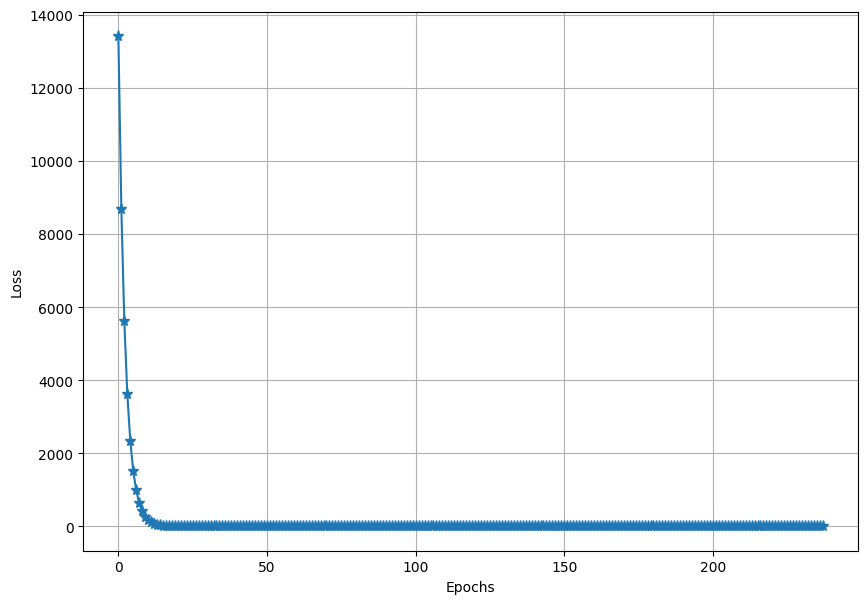

In [36]:
plot_loss(loss,'LR = 0.00001 ')

### Plot loss vs. each theta

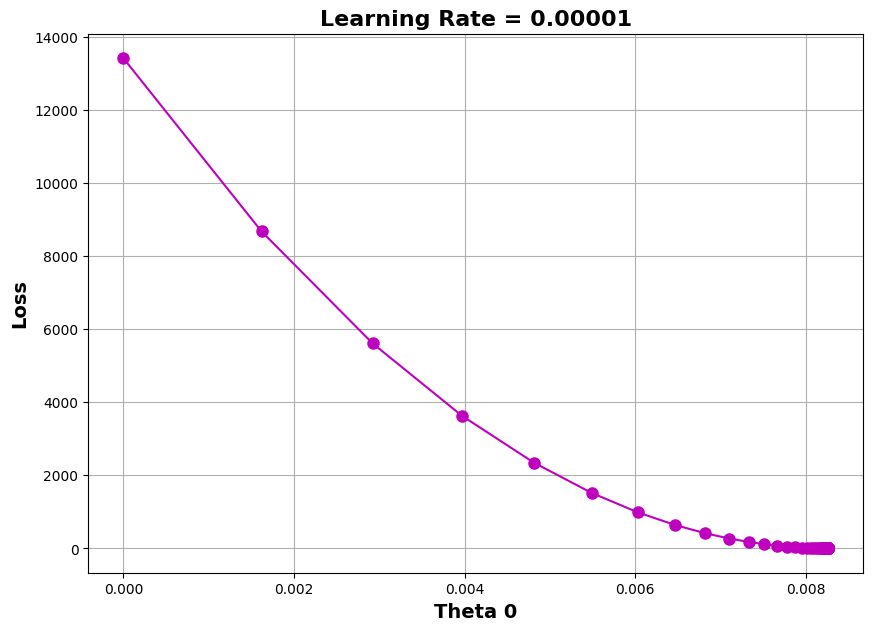

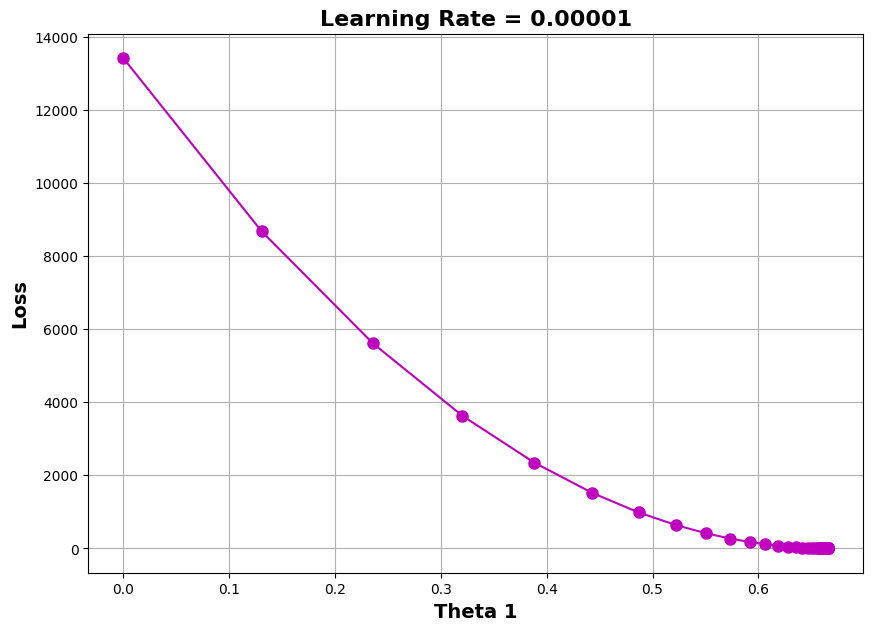

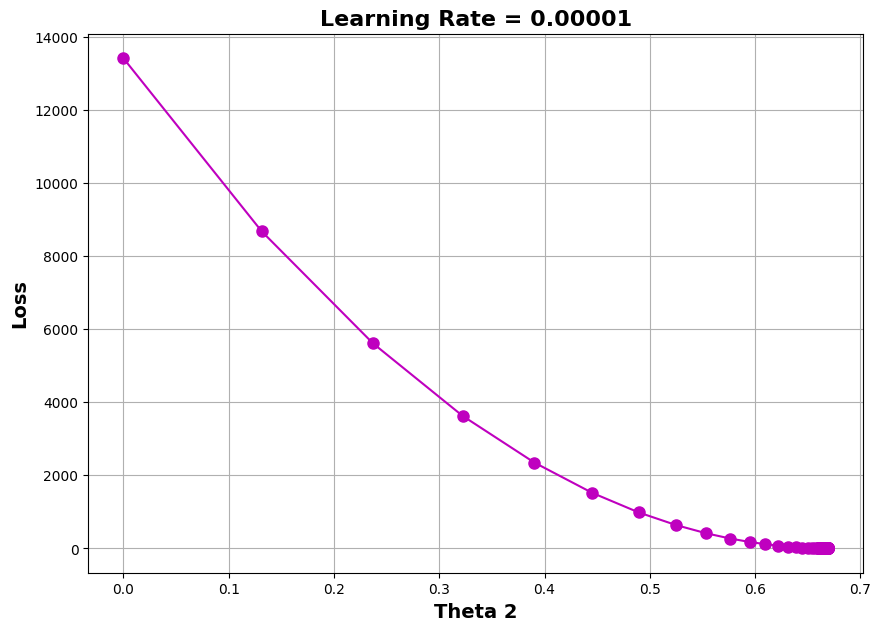

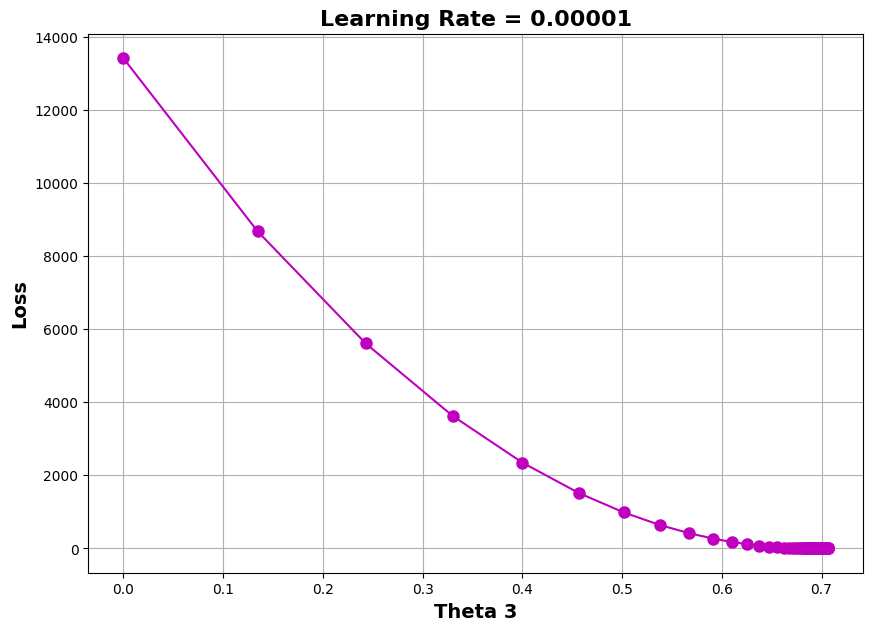

In [37]:
ths_arr = np.array(thetas_all).reshape(len(thetas_all),4)
plot_theta_loss(ths_arr[:,0:1],'Theta 0',loss,'Learning Rate = 0.00001')
plot_theta_loss(ths_arr[:,1:2],'Theta 1',loss,'Learning Rate = 0.00001')
plot_theta_loss(ths_arr[:,2:3],'Theta 2',loss,'Learning Rate = 0.00001')
plot_theta_loss(ths_arr[:,3:4],'Theta 3',loss,'Learning Rate = 0.00001')

- Use <b>learning rate = 0.0001</b> and see the difference in learning curves and <b>r2_score</b>.
- You can also try larger learning rate i.e. <b>0.001</b> and see how the optimizer diverges and <b>r2_score</b>.

In [38]:
thetas = np.zeros((4,1))

alpha = 0.0001

max_iter = 10000

grad_check = 0.1
conv_check = 0.001

loss = []

thetas_all = []

for i in range(max_iter):
    print(f'****************** Iteration {i} ********************\n')
    thetas_all.append(thetas)

    h = x@thetas
    print(f'h(x):{h}\n')
    
    e = h-y

    j= np.linalg.norm(e)**2/(2*m)
    loss.append(j)
    print(f'Error Vector:\n{e}\n')
    print(f'j = {j}\n')
    
    grad = x.T @ e /m
    print(f'Gradient Vector:\n{grad}\n')
    grad_norm = np.linalg.norm(grad)
    print(f'Gradient Vector Norm:\n{grad_norm}\n')
    
    if grad_norm <grad_check:
        print(f'****************** Training Report ********************\n')
        print(f'Gradient Descent converged after {i+1} epochs\n')
        print(f'theta_Opt :\n {thetas}\n')
        print(f'Error Vector:\n{e}\n')
        print(f'Cost = {j}\n')
        print(f'h(x) = y_predict:\n{h}\n')
        print(f'y_actual:\n{y}\n')
        break
    elif i>0 and np.absolute(loss[i-1] - loss[i])<conv_check:
        print(f'****************** Training Report ********************\n')
        print(f'Gradient Descent converged after {i+1} epochs\n')
        print(f'theta_Opt :\n {thetas}\n')
        print(f'Error Vector:\n{e}\n')
        print(f'Cost = {j}\n')
        print(f'h(x) = y_predict:\n{h}\n')
        print(f'y_actual:\n{y}\n')
        break
    
    thetas =  thetas - alpha * grad
    print(f'New Thetas : {thetas}\n')

****************** Iteration 0 ********************

h(x):[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]

Error Vector:
[[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]

j = 13405.98

Gradient Vector:
[[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]

Gradient Vector Norm:
22917.5459892197

New Thetas : [[0.016204]
 [1.30758 ]
 [1.31472 ]
 [1.346708]]

****************** Iteration 1 ********************

h(x):[[301.650244]
 [362.560348]
 [357.234064]
 [389.057244]
 [276.510624]
 [203.864004]
 [291.22502 ]
 [215.899264]
 [338.842264]
 [313.855728]
 [280.579308]
 [276.659996]
 [369.069972]
 [306.802308]
 [292.564588]
 [367.915192]
 [292.187588]
 [349.498828]
 [351.854372]
 [314.82572 ]
 [341.507404]
 [340.132

In [39]:
y_pred_GD_Multi = calc_best_fit(thetas)
print(f'r squared: {r2_score(y,y_pred_GD_Multi)}')

r squared: 0.9879310084690472


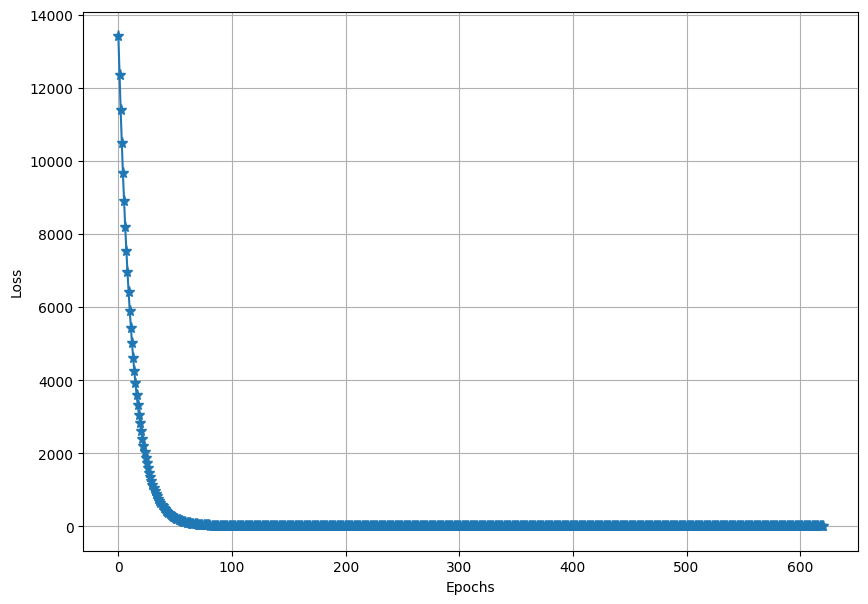

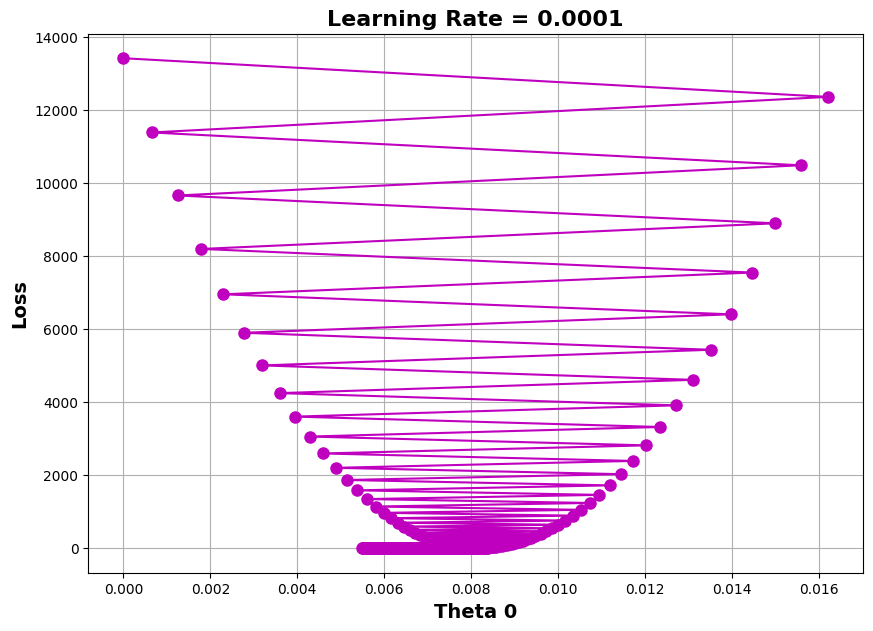

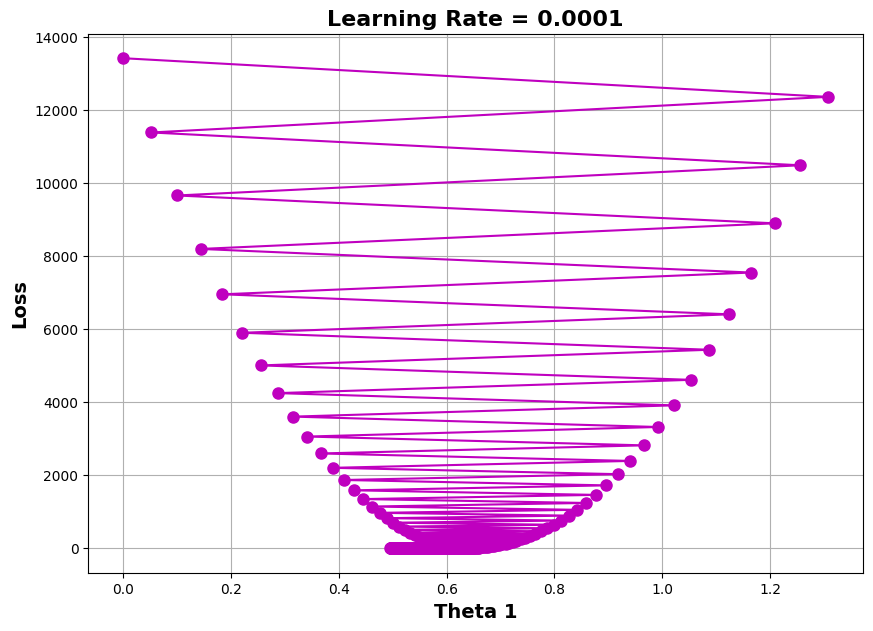

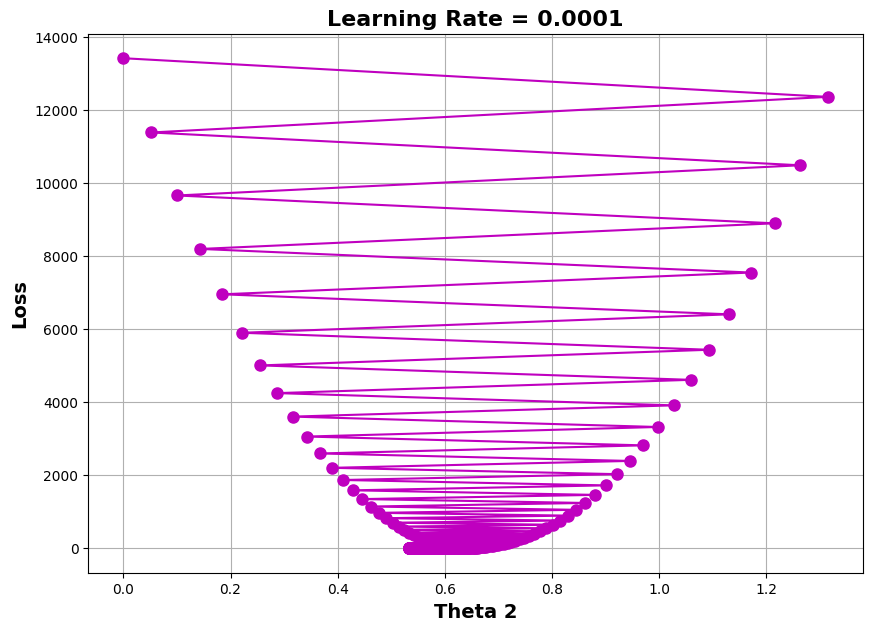

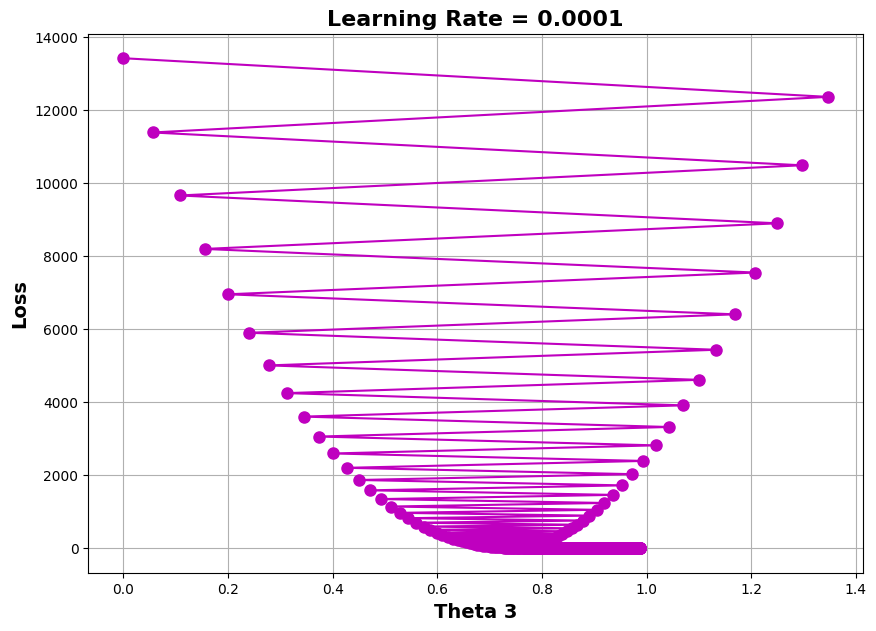

In [40]:
plot_loss(loss,'LR = 0.0001 ')
ths_arr = np.array(thetas_all).reshape(len(thetas_all),4)
plot_theta_loss(ths_arr[:,0:1],'Theta 0',loss,'Learning Rate = 0.0001')
plot_theta_loss(ths_arr[:,1:2],'Theta 1',loss,'Learning Rate = 0.0001')
plot_theta_loss(ths_arr[:,2:3],'Theta 2',loss,'Learning Rate = 0.0001')
plot_theta_loss(ths_arr[:,3:4],'Theta 3',loss,'Learning Rate = 0.0001')

In [41]:
thetas = np.zeros((4,1))

alpha = 0.001

max_iter = 10000

grad_check = 0.1
conv_check = 0.001

loss = []

thetas_all = []

for i in range(max_iter):
    print(f'****************** Iteration {i} ********************\n')
    thetas_all.append(thetas)

    h = x@thetas
    print(f'h(x):{h}\n')
    
    e = h-y

    j= np.linalg.norm(e)**2/(2*m)
    loss.append(j)
    print(f'Error Vector:\n{e}\n')
    print(f'j = {j}\n')
    
    grad = x.T @ e /m
    print(f'Gradient Vector:\n{grad}\n')
    grad_norm = np.linalg.norm(grad)
    print(f'Gradient Vector Norm:\n{grad_norm}\n')
    
    if grad_norm <grad_check:
        print(f'****************** Training Report ********************\n')
        print(f'Gradient Descent converged after {i+1} epochs\n')
        print(f'theta_Opt :\n {thetas}\n')
        print(f'Error Vector:\n{e}\n')
        print(f'Cost = {j}\n')
        print(f'h(x) = y_predict:\n{h}\n')
        print(f'y_actual:\n{y}\n')
        break
    elif i>0 and np.absolute(loss[i-1] - loss[i])<conv_check:
        print(f'****************** Training Report ********************\n')
        print(f'Gradient Descent converged after {i+1} epochs\n')
        print(f'theta_Opt :\n {thetas}\n')
        print(f'Error Vector:\n{e}\n')
        print(f'Cost = {j}\n')
        print(f'h(x) = y_predict:\n{h}\n')
        print(f'y_actual:\n{y}\n')
        break
    
    thetas =  thetas - alpha * grad
    print(f'New Thetas : {thetas}\n')

****************** Iteration 0 ********************

h(x):[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]

Error Vector:
[[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]

j = 13405.98

Gradient Vector:
[[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]

Gradient Vector Norm:
22917.5459892197

New Thetas : [[ 0.16204]
 [13.0758 ]
 [13.1472 ]
 [13.46708]]

****************** Iteration 1 ********************

h(x):[[3016.50244]
 [3625.60348]
 [3572.34064]
 [3890.57244]
 [2765.10624]
 [2038.64004]
 [2912.2502 ]
 [2158.99264]
 [3388.42264]
 [3138.55728]
 [2805.79308]
 [2766.59996]
 [3690.69972]
 [3068.02308]
 [2925.64588]
 [3679.15192]
 [2921.87588]
 [3494.98828]
 [3518.54372]
 [3148.2572 ]
 [3415.07404]
 [3401.32

C:\Users\Dareen\AppData\Local\Temp\ipykernel_67084\466234378.py:42: RuntimeWarning: invalid value encountered in scalar subtract
  elif i>0 and np.absolute(loss[i-1] - loss[i])<conv_check:
C:\Users\Dareen\AppData\Local\Temp\ipykernel_67084\466234378.py:28: RuntimeWarning: overflow encountered in matmul
  grad = x.T @ e /m
C:\Users\Dareen\AppData\Local\Temp\ipykernel_67084\466234378.py:52: RuntimeWarning: invalid value encountered in subtract
  thetas =  thetas - alpha * grad


Error Vector:
[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]]

j = nan

Gradient Vector:
[[nan]
 [nan]
 [nan]
 [nan]]

Gradient Vector Norm:
nan

New Thetas : [[nan]
 [nan]
 [nan]
 [nan]]

****************** Iteration 9341 ********************

h(x):[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]]

Error Vector:
[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]]

j = nan

Gradient Vector:
[[nan]
 [nan]
 [nan]
 [nan]]

Gradient Vector Norm:
nan

New Thetas : [[nan]
 [nan]
 [nan]
 [nan]]

****************** Iteration 9342 ********************

h(x):[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [na

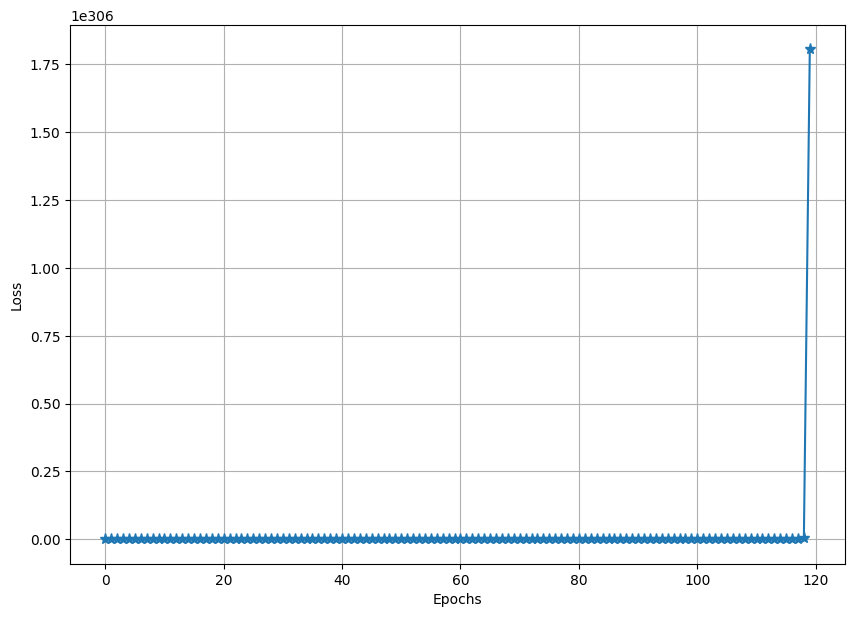

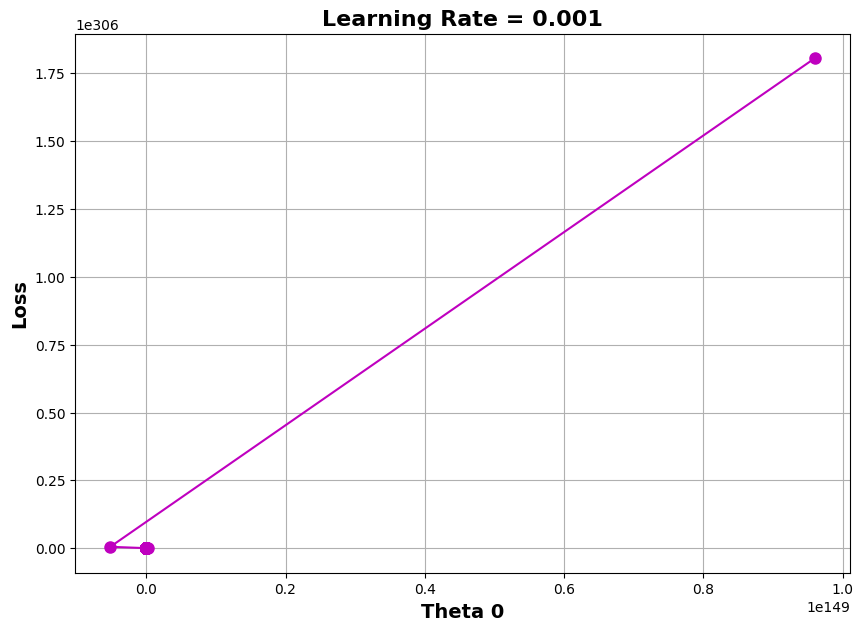

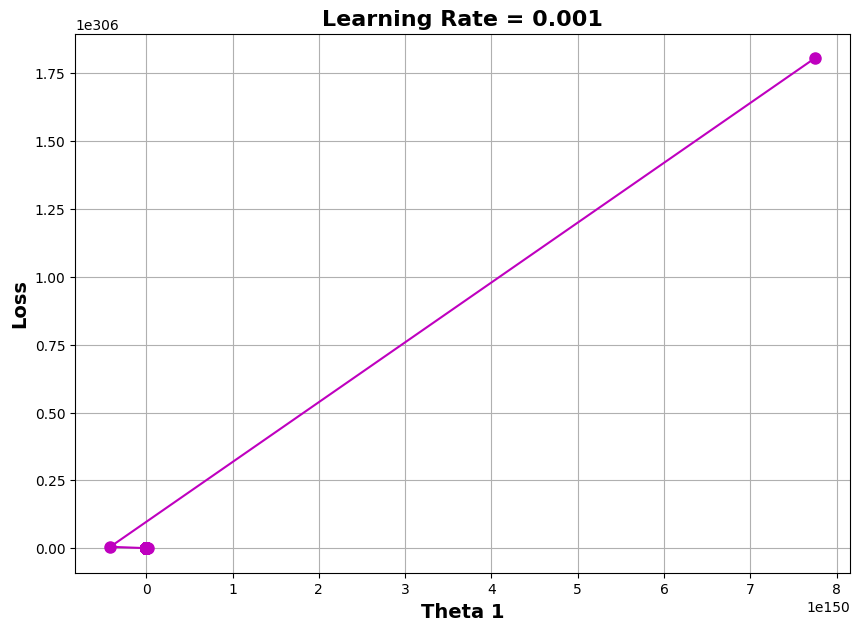

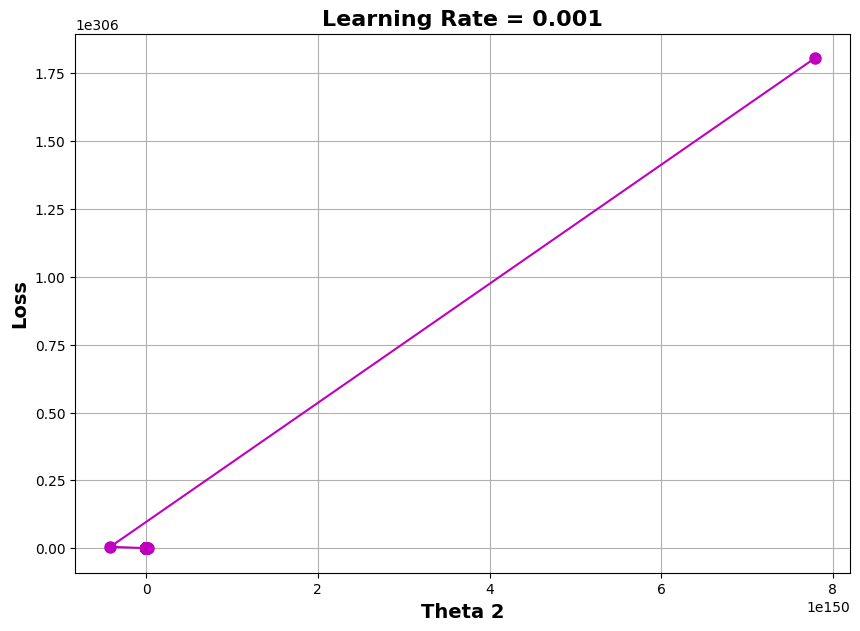

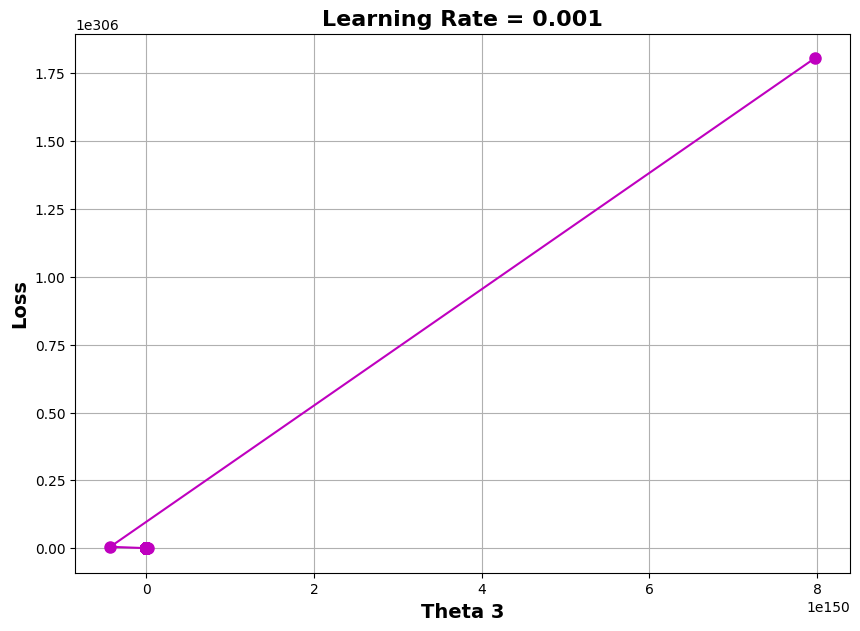

In [42]:
plot_loss(loss,'LR = 0.001 ')
ths_arr = np.array(thetas_all).reshape(len(thetas_all),4)
plot_theta_loss(ths_arr[:,0:1],'Theta 0',loss,'Learning Rate = 0.001')
plot_theta_loss(ths_arr[:,1:2],'Theta 1',loss,'Learning Rate = 0.001')
plot_theta_loss(ths_arr[:,2:3],'Theta 2',loss,'Learning Rate = 0.001')
plot_theta_loss(ths_arr[:,3:4],'Theta 3',loss,'Learning Rate = 0.001')

## Make all as funtions:


#### Use your previous code and create a function to perform GD for Muli-variable linear regression.
#### The function should take the following input parameters:
##### Input data (X), Target Labels (y), Learning Rate (alpha), Maximum number of iterations, stop conditions values.
#### The function should return the following:
##### All Theta values till converge, and equivellant Losses.

In [62]:
def GD_Multivar(X,y,alpha=0.001,max_iters=1000,grad_check=0.001,conv_check=0.001):
    
    m = X.shape[0]
    X_new = np.concatenate((np.ones((m,1)),X),axis=1)
    X_new

    thetas = np.zeros((4,1))



    loss = []

    thetas_all = []

    for i in range(max_iters):
        print(f'****************** Iteration {i} ********************\n')
        thetas_all.append(thetas)

        h = X_new@thetas
        print(f'h(x):{h}\n')

        e = h-y

        j= np.linalg.norm(e)**2/(2*m)
        loss.append(j)
        print(f'Error Vector:\n{e}\n')
        print(f'j = {j}\n')

        grad = X_new.T @ e /m
        print(f'Gradient Vector:\n{grad}\n')
        grad_norm = np.linalg.norm(grad)
        print(f'Gradient Vector Norm:\n{grad_norm}\n')

        if grad_norm <grad_check:
            print(f'****************** Training Report ********************\n')
            print(f'Gradient Descent converged after {i+1} epochs\n')
            print(f'theta_Opt :\n {thetas}\n')
            print(f'Error Vector:\n{e}\n')
            print(f'Cost = {j}\n')
            print(f'h(x) = y_predict:\n{h}\n')
            print(f'y_actual:\n{y}\n')
            break
        elif i>0 and np.absolute(loss[i-1] - loss[i])<conv_check:
            print(f'****************** Training Report ********************\n')
            print(f'Gradient Descent converged after {i+1} epochs\n')
            print(f'theta_Opt :\n {thetas}\n')
            print(f'Error Vector:\n{e}\n')
            print(f'Cost = {j}\n')
            print(f'h(x) = y_predict:\n{h}\n')
            print(f'y_actual:\n{y}\n')
            break

        thetas =  thetas - alpha * grad
        print(f'New Thetas : {thetas}\n')
    
    return loss, thetas_all

In [63]:
x= data[:,:3]
y=data[:,3]
y=y.reshape(-1,1)

In [64]:
L,T = GD_Multivar(x,y,0.00001,10000,0.1,0.001)

****************** Iteration 0 ********************

h(x):[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]

Error Vector:
[[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]

j = 13405.98

Gradient Vector:
[[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]

Gradient Vector Norm:
22917.5459892197

New Thetas : [[0.0016204]
 [0.130758 ]
 [0.131472 ]
 [0.1346708]]

****************** Iteration 1 ********************

h(x):[[30.1650244]
 [36.2560348]
 [35.7234064]
 [38.9057244]
 [27.6510624]
 [20.3864004]
 [29.122502 ]
 [21.5899264]
 [33.8842264]
 [31.3855728]
 [28.0579308]
 [27.6659996]
 [36.9069972]
 [30.6802308]
 [29.2564588]
 [36.7915192]
 [29.2187588]
 [34.9498828]
 [35.1854372]
 [31.482572 ]
 [34.1507404]
 [34.

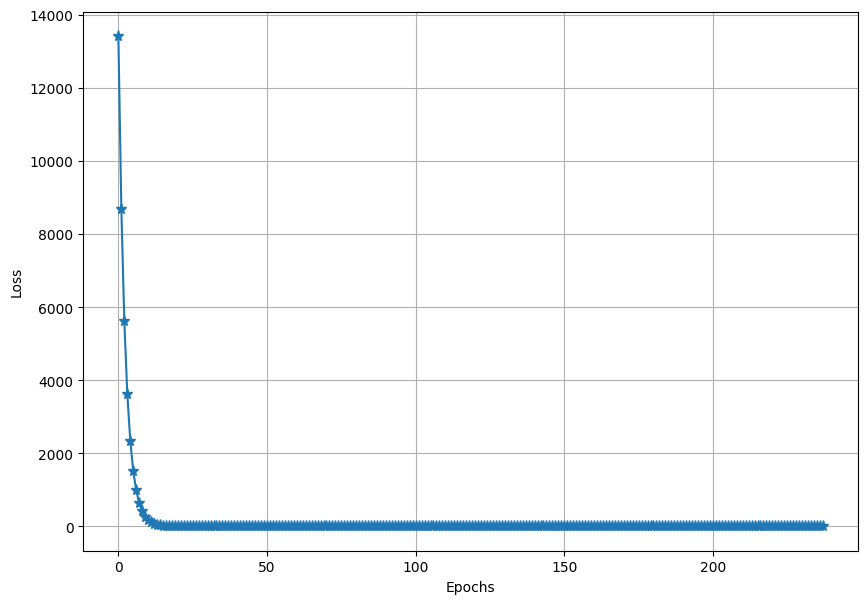

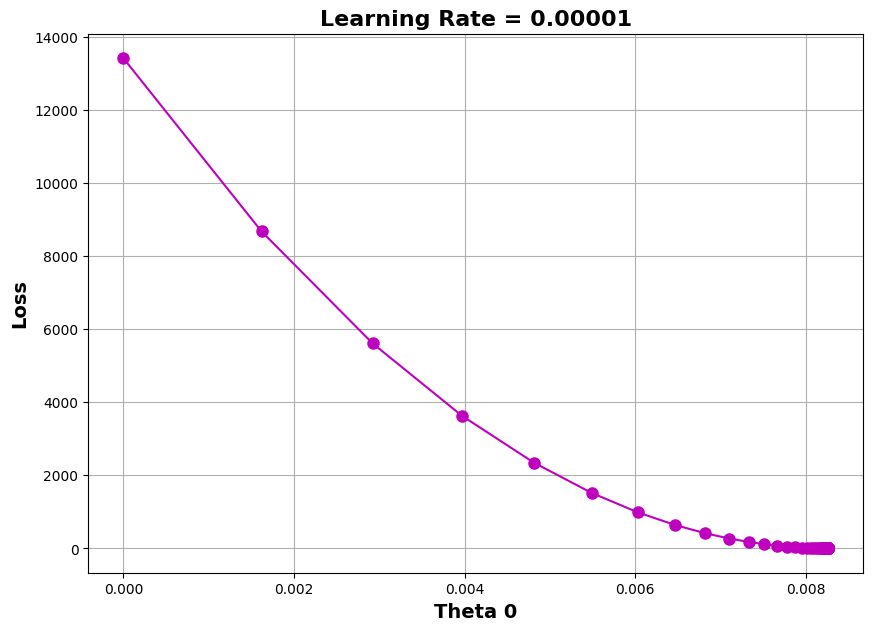

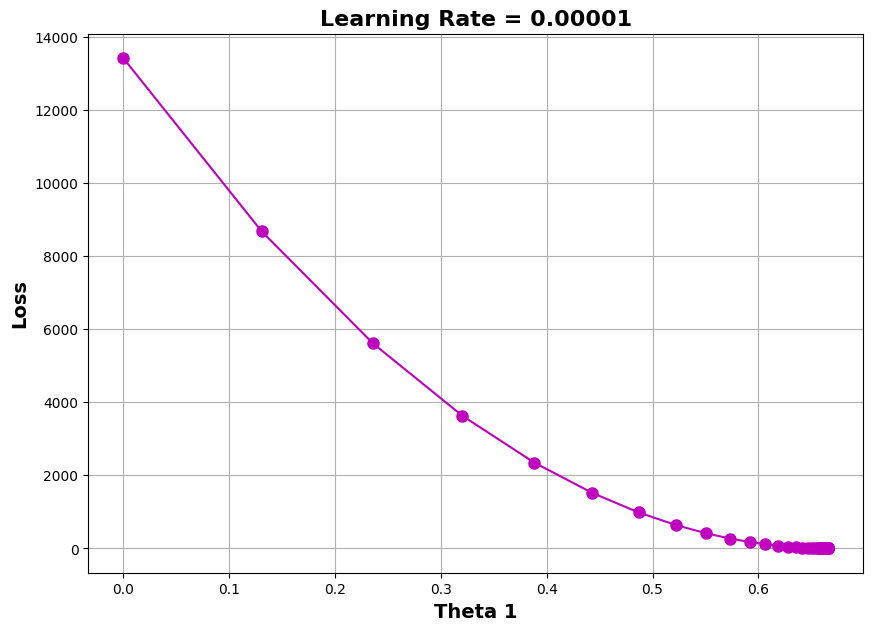

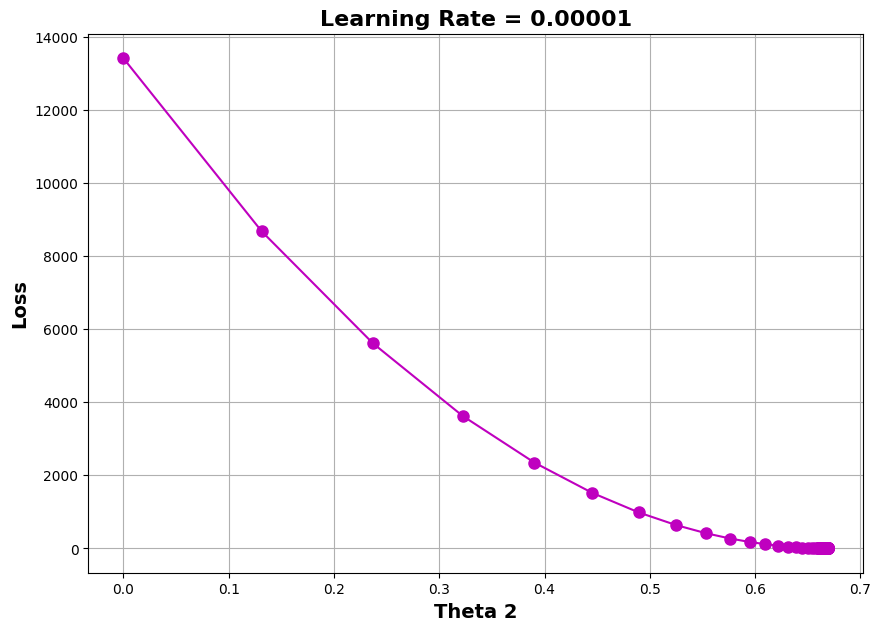

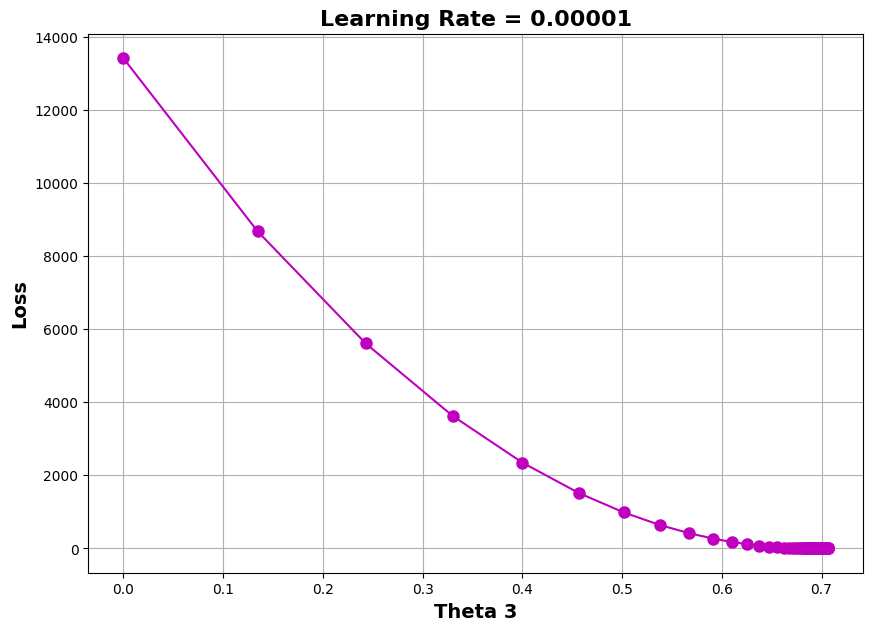

In [66]:
plot_loss(L,'LR = 0.00001 ')
ths_arr = np.array(T).reshape(len(T),4)
plot_theta_loss(ths_arr[:,0:1],'Theta 0',L,'Learning Rate = 0.00001')
plot_theta_loss(ths_arr[:,1:2],'Theta 1',L,'Learning Rate = 0.00001')
plot_theta_loss(ths_arr[:,2:3],'Theta 2',L,'Learning Rate = 0.00001')
plot_theta_loss(ths_arr[:,3:4],'Theta 3',L,'Learning Rate = 0.00001')